In [1]:
import numpy as np
import matplotlib.pyplot as plt

In [2]:
cartesian_random_mask, cartesian_random_img = np.load('./model_outputs/cartesian, 8x, 3 channel random newnew.npy')
cartesian_mask, cartesian_img = np.load('./model_outputs/cartesian, 8x, 3 channel.npy')
cartesian_single_mask, cartesian_single_img = np.load('./model_outputs/cartesian, 8x, 1 channel.npy')

radial_rotate_mask, radial_rotate_img = np.load('./model_outputs/radial, 8x, 3 channel rotate.npy')
radial_mask, radial_img = np.load('./model_outputs/radial, 8x, 3 channel.npy')
radial_single_mask, radial_single_img = np.load('./model_outputs/radial, 8x, 1 channel.npy')

tre_channel_mask,  tre_channel_img = np.load('./model_outputs/3 channel, slope=200, sample_slope=200, 40iters, lr=0.01, sparsity=0.125, lambda=0.001.npy')
tre_channel_same_mask,  tre_channel_same_img = np.load('./model_outputs/1 channel, slope=200, sample_slope=200, 40iters, lr=0.01, sparsity=0.125, lambda=0.001, extend to three.npy')
one_channel_mask, one_channel_img = np.load('./model_outputs/1 channel, slope=200, sample_slope=200, 40iters, lr=0.01, sparsity=0.125, lambda=0.001.npy')

ground_truth = np.load('./model_outputs/ground_truth.npy')

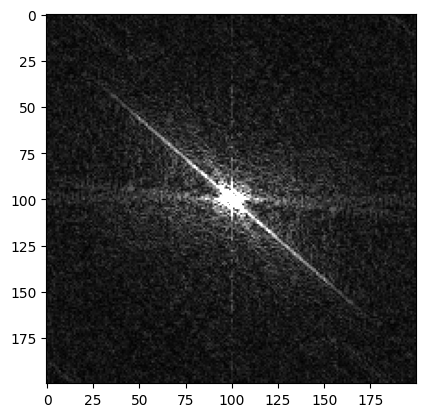

In [3]:
frequency_space = []
for i in range(3):
    frequency_space.append(np.abs(np.fft.fftshift(np.fft.fft2(ground_truth[i]))))
plt.imshow(frequency_space[2],vmax=100,cmap='gray')

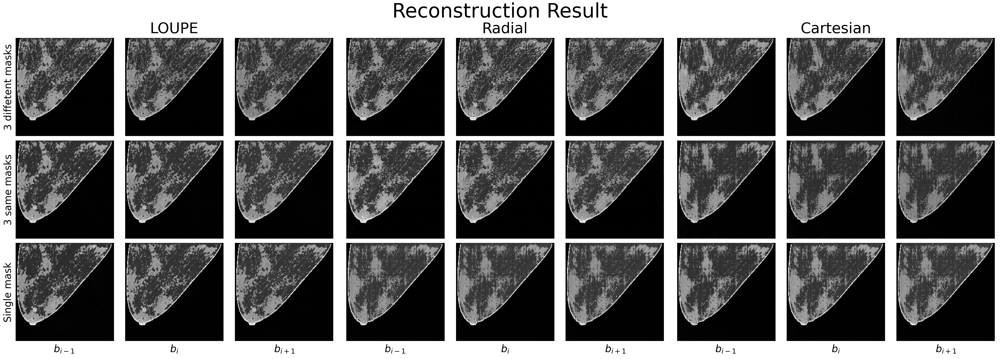

In [4]:
fig = plt.figure(layout='constrained', figsize=(42, 15))

plt.suptitle("Reconstruction Result",fontsize = 60)
subfigs = fig.subfigures(3, 2, wspace=0, height_ratios=[1,25,1], width_ratios=[1,100])

subfigs = subfigs[1,1].subfigures(3, 3, wspace=0.02)

subfigs[0,0].text(0.5,1.04,'LOUPE',horizontalalignment='center',fontsize = 45)
subfigs[0,0].text(-0.012,0.5,'3 diffetent masks',rotation=90,rotation_mode='default',horizontalalignment='center',verticalalignment='center',fontsize = 30)

ax = subfigs[0,0].subplots(1,3)
for i in range(3):
    ax[i].imshow(tre_channel_img[i],cmap='gray')
    ax[i].axis('off')

subfigs[0,1].text(0.5,1.04,'Radial',horizontalalignment='center',fontsize = 45)
ax = subfigs[0,1].subplots(1,3)
for i in range(3):
    ax[i].imshow(radial_rotate_img[i],cmap='gray')
    ax[i].axis('off')

subfigs[0,2].text(0.5,1.04,'Cartesian',horizontalalignment='center',fontsize = 45)
ax = subfigs[0,2].subplots(1,3)
for i in range(3):
    ax[i].imshow(cartesian_random_img[i],cmap='gray')
    ax[i].axis('off')


ax = subfigs[1,0].subplots(1,3)
subfigs[1,0].text(-0.012,0.5,'3 same masks',rotation=90,rotation_mode='default',horizontalalignment='center',verticalalignment='center',fontsize = 30)
for i in range(3):
    ax[i].imshow(tre_channel_same_img[i],cmap='gray')
    ax[i].axis('off')

ax = subfigs[1,1].subplots(1,3)
for i in range(3):
    ax[i].imshow(radial_img[i],cmap='gray')
    ax[i].axis('off')

ax = subfigs[1,2].subplots(1,3)
for i in range(3):
    ax[i].imshow(cartesian_img[i],cmap='gray')
    ax[i].axis('off')


ax = subfigs[2,0].subplots(1,3)
subfigs[2,0].text(-0.012,0.5,'Single mask',rotation=90,rotation_mode='default',horizontalalignment='center',verticalalignment='center',fontsize = 30)
for i in range(3):
    ax[i].imshow(one_channel_img[i],cmap='gray')
    ax[i].axis('off')
subfigs[2,0].text(0.16,-0.1,'$b_{i-1}$',horizontalalignment='center',fontsize = 30)
subfigs[2,0].text(0.5,-0.1,'$b_{i}$',horizontalalignment='center',fontsize = 30)
subfigs[2,0].text(0.84,-0.1,'$b_{i+1}$',horizontalalignment='center',fontsize = 30)

ax = subfigs[2,1].subplots(1,3)
for i in range(3):
    ax[i].imshow(radial_single_img[i],cmap='gray')
    ax[i].axis('off')
subfigs[2,1].text(0.16,-0.1,'$b_{i-1}$',horizontalalignment='center',fontsize = 30)
subfigs[2,1].text(0.5,-0.1,'$b_{i}$',horizontalalignment='center',fontsize = 30)
subfigs[2,1].text(0.84,-0.1,'$b_{i+1}$',horizontalalignment='center',fontsize = 30)

ax = subfigs[2,2].subplots(1,3)
for i in range(3):
    ax[i].imshow(cartesian_single_img[i],cmap='gray')
    ax[i].axis('off')
subfigs[2,2].text(0.16,-0.1,'$b_{i-1}$',horizontalalignment='center',fontsize = 30)
subfigs[2,2].text(0.5,-0.1,'$b_{i}$',horizontalalignment='center',fontsize = 30)
subfigs[2,2].text(0.84,-0.1,'$b_{i+1}$',horizontalalignment='center',fontsize = 30)

plt.show()

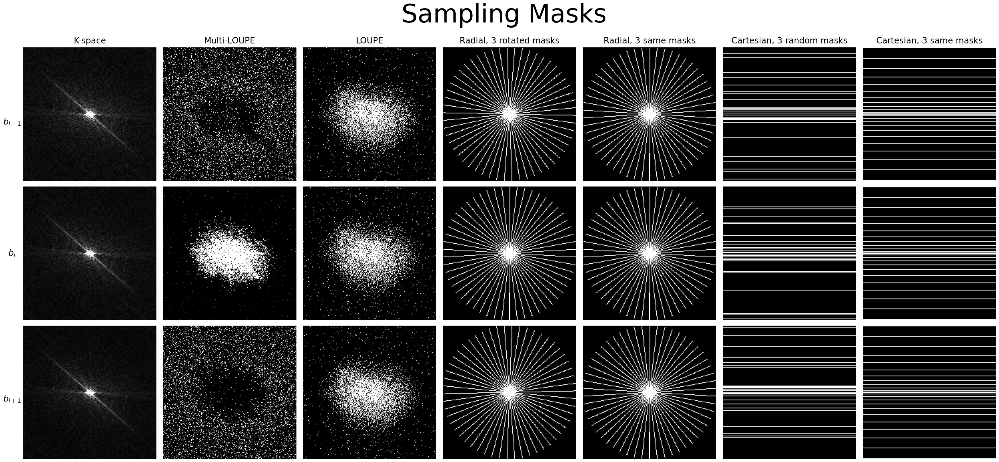

In [5]:
fig, ax = plt.subplots(3,7,figsize=(36,16))
plt.suptitle("Sampling Masks",horizontalalignment='center',x=0.55, fontsize = 60)

fig.text(0.1,0.73,'$b_{i-1}$',horizontalalignment='center',fontsize = 20)
fig.text(0.1,0.46,'$b_{i}$',horizontalalignment='center',fontsize = 20)
fig.text(0.1,0.16,'$b_{i+1}$',horizontalalignment='center',fontsize = 20)

ax[0,0].set_title('K-space',horizontalalignment='center',verticalalignment='center',x=0.5,y=1.03,fontsize=20)
for i in range(3):
    ax[i,0].imshow(frequency_space[i],vmax=200,cmap='gray')

ax[0,1].set_title('Multi-LOUPE',horizontalalignment='center',verticalalignment='center',x=0.5,y=1.03,fontsize=20)
for i in range(3):
    ax[i,1].imshow(tre_channel_mask[i],cmap='gray')

ax[0,2].set_title('LOUPE',horizontalalignment='center',verticalalignment='center',x=0.5,y=1.03,fontsize=20)
for i in range(3):
    ax[i,2].imshow(one_channel_mask[i],cmap='gray')

ax[0,3].set_title('Radial, 3 rotated masks',horizontalalignment='center',verticalalignment='center',x=0.5,y=1.03,fontsize=20)
for i in range(3):
    ax[i,3].imshow(radial_rotate_mask[i],cmap='gray')

ax[0,4].set_title('Radial, 3 same masks',horizontalalignment='center',verticalalignment='center',x=0.5,y=1.03,fontsize=20)
for i in range(3):
    ax[i,4].imshow(radial_mask[i],cmap='gray')

ax[0,5].set_title('Cartesian, 3 random masks',horizontalalignment='center',verticalalignment='center',x=0.5,y=1.03,fontsize=20)
for i in range(3):
    ax[i,5].imshow(cartesian_random_mask[i],cmap='gray')

ax[0,6].set_title('Cartesian, 3 same masks',horizontalalignment='center',verticalalignment='center',x=0.5,y=1.03,fontsize=20)
for i in range(3):
    ax[i,6].imshow(cartesian_mask[i],cmap='gray')

for a in ax:
    for b in a:
        b.axis('off')

plt.subplots_adjust(left=0.11, bottom=0, right=1, top=0.93, wspace=0.05, hspace=-0.2)
plt.show()

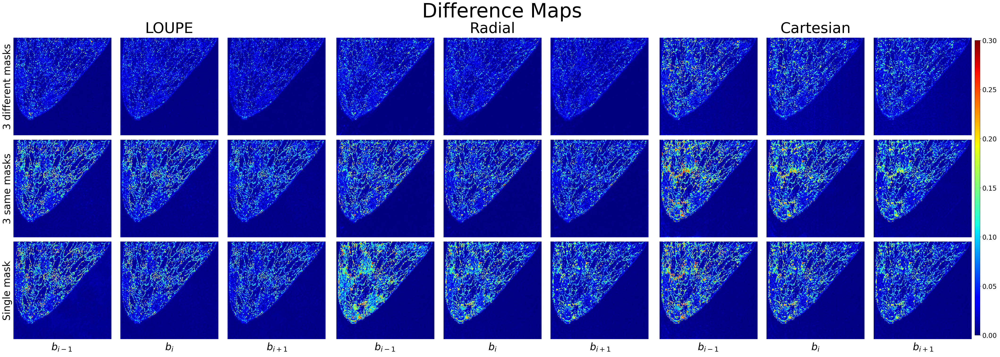

In [8]:
fig = plt.figure(layout='constrained', figsize=(42, 15))

plt.suptitle("Difference Maps",fontsize = 60)
sb = fig.subfigures(3, 3, wspace=0, height_ratios=[1,25,1], width_ratios=[0.1,20,0.5])

subfigs = sb[1,1].subfigures(3, 3, wspace=0.02)

subfigs[0,0].text(0.5,1.04,'LOUPE',horizontalalignment='center',fontsize = 45)
subfigs[0,0].text(-0.012,0.5,'3 different masks',rotation=90,rotation_mode='default',horizontalalignment='center',verticalalignment='center',fontsize = 30)

ax = subfigs[0,0].subplots(1,3)
for i in range(3):
    ax[i].imshow(np.abs(tre_channel_img[i]-ground_truth[i]),vmin=-0,vmax=0.3,cmap='jet')
    ax[i].axis('off')

subfigs[0,1].text(0.5,1.04,'Radial',horizontalalignment='center',fontsize = 45)
ax = subfigs[0,1].subplots(1,3)
for i in range(3):
    ax[i].imshow(np.abs(radial_rotate_img[i]-ground_truth[i]),vmin=-0,vmax=0.3,cmap='jet')
    ax[i].axis('off')

subfigs[0,2].text(0.5,1.04,'Cartesian',horizontalalignment='center',fontsize = 45)
ax = subfigs[0,2].subplots(1,3)
for i in range(3):
    ax[i].imshow(np.abs(cartesian_random_img[i]-ground_truth[i]),vmin=-0,vmax=0.3,cmap='jet')
    ax[i].axis('off')
a1 = ax[i]

ax = subfigs[1,0].subplots(1,3)
subfigs[1,0].text(-0.012,0.5,'3 same masks',rotation=90,rotation_mode='default',horizontalalignment='center',verticalalignment='center',fontsize = 30)
for i in range(3):
    ax[i].imshow(np.abs(tre_channel_same_img[i]-ground_truth[i]),vmin=-0,vmax=0.3,cmap='jet')
    ax[i].axis('off')


ax = subfigs[1,1].subplots(1,3)
for i in range(3):
    ax[i].imshow(np.abs(radial_img[i]-ground_truth[i]),vmin=-0,vmax=0.3,cmap='jet')
    ax[i].axis('off')

ax = subfigs[1,2].subplots(1,3)
for i in range(3):
    ax[i].imshow(np.abs(cartesian_img[i]-ground_truth[i]),vmin=-0,vmax=0.3,cmap='jet')
    ax[i].axis('off')
a2 = ax[i]


ax = subfigs[2,0].subplots(1,3)
subfigs[2,0].text(-0.012,0.5,'Single mask',rotation=90,rotation_mode='default',horizontalalignment='center',verticalalignment='center',fontsize = 30)
for i in range(3):
    ax[i].imshow(np.abs(one_channel_img[i]-ground_truth[i]),vmin=-0,vmax=0.3,cmap='jet')
    ax[i].axis('off')
subfigs[2,0].text(0.16,-0.1,'$b_{i-1}$',horizontalalignment='center',fontsize = 30)
subfigs[2,0].text(0.5,-0.1,'$b_{i}$',horizontalalignment='center',fontsize = 30)
subfigs[2,0].text(0.84,-0.1,'$b_{i+1}$',horizontalalignment='center',fontsize = 30)

ax = subfigs[2,1].subplots(1,3)
for i in range(3):
    ax[i].imshow(np.abs(radial_single_img[i]-ground_truth[i]),vmin=-0,vmax=0.3,cmap='jet')
    ax[i].axis('off')
subfigs[2,1].text(0.16,-0.1,'$b_{i-1}$',horizontalalignment='center',fontsize = 30)
subfigs[2,1].text(0.5,-0.1,'$b_{i}$',horizontalalignment='center',fontsize = 30)
subfigs[2,1].text(0.84,-0.1,'$b_{i+1}$',horizontalalignment='center',fontsize = 30)

ax = subfigs[2,2].subplots(1,3)
for i in range(3):
    im=ax[i].imshow(np.abs(cartesian_single_img[i]-ground_truth[i]),vmin=-0,vmax=0.3,cmap='jet')
    ax[i].axis('off')
subfigs[2,2].text(0.16,-0.1,'$b_{i-1}$',horizontalalignment='center',fontsize = 30)
subfigs[2,2].text(0.5,-0.1,'$b_{i}$',horizontalalignment='center',fontsize = 30)
subfigs[2,2].text(0.84,-0.1,'$b_{i+1}$',horizontalalignment='center',fontsize = 30)

a3 = ax[i]

aa = sb[1,2].subplots(1, 1, sharex=True)

#axsRight = sb[2,1].subplots(3, 1, sharex=True)
cbar = fig.colorbar(im,cax=aa,fraction=0.020)
cbar.ax.tick_params(labelsize=20)

plt.show()